In [1]:
# import osmnx as ox
import pandas as pd
import geopandas as gpd
import networkx as nx

import warnings
import sys
import os
warnings.filterwarnings("ignore")
sys.stderr = open(os.devnull, 'w')

# local crs
local_crs = 32636

In [2]:
okrugs = gpd.read_parquet('data\model_data\okrugs.parquet')
rayons = gpd.read_parquet('data/model_data/rayons.parquet')
towns = gpd.read_parquet('data\model_data/towns.parquet')

In [20]:
import pandas as pd

# # Use pandas to read the Parquet file
adj_mx = pd.read_parquet('C:\Code\PopFrame\examples\data/adj_mx\max_connectivity_newroads.parquet')
# adj_mx = pd.read_parquet('C:\Code\PopFrame\examples\data/adj_mx\max_connectivity.parquet')
# Display the loaded DataFrame
adj_mx

,0,1,2,3,4,5,6,7,8,9,...,2921,2922,2923,2924,2925,2926,2927,2928,2929,2930
0,0.000000,11.687417,12.024583,10.793467,7.706417,3.430783,21.595867,28.751767,8.414917,17.122383,...,129.784298,131.454224,129.321091,134.594058,139.427198,139.427198,132.374215,137.076741,135.733408,136.884615
1,11.687417,0.000000,0.337167,4.313350,17.966250,13.690617,29.636783,36.792683,16.455833,10.347433,...,118.718315,120.388241,118.255108,123.528074,128.361215,128.361215,121.308231,126.010758,124.667424,125.818631
2,12.024583,0.337167,0.000000,4.650517,18.303417,14.027783,29.973950,37.129850,16.246817,10.684600,...,118.381148,120.051074,117.917941,123.190908,128.024048,128.024048,120.971065,125.673591,124.330258,125.481465
3,10.793467,4.313350,4.650517,0.000000,17.072300,12.796667,28.742833,35.898733,15.561883,9.748317,...,122.410231,124.080158,121.947024,127.219991,132.053131,132.053131,125.000148,129.702674,128.359341,129.510548
4,7.706417,17.966250,18.303417,17.072300,0.000000,4.275633,27.874700,35.030600,14.693750,23.401217,...,136.063131,137.733058,135.599924,140.872891,145.706031,145.706031,138.653048,143.355574,142.012241,143.163448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2926,141.056867,129.990884,129.653717,133.682801,147.335701,143.060067,159.006234,166.162134,143.397184,139.716884,...,24.994667,29.116733,31.821667,32.256567,0.000000,0.000000,17.445683,39.577317,38.233983,32.094983
2927,134.003884,122.937901,122.600734,126.629817,140.282717,136.007084,151.953251,159.109151,136.344201,132.663901,...,17.941683,22.063750,24.768683,25.203583,17.445683,17.445683,0.000000,32.524333,31.181000,25.042000
2928,137.084040,126.018056,125.680890,129.709973,143.362873,139.087240,155.033406,162.189306,139.424356,135.744056,...,18.604083,10.685517,7.755650,13.825350,39.581700,39.581700,32.528717,0.000000,1.343333,26.855167
2929,135.740706,124.674723,124.337556,128.366640,142.019540,137.743906,153.690073,160.845973,138.081023,134.400723,...,17.260750,9.342183,6.412317,12.482017,38.238367,38.238367,31.185383,1.343333,0.000000,25.511833


In [21]:
# from popframe.models.region import Region
# region_model = Region.from_pickle('/Users/mvin/Code/PopFrame/examples/data/data_models/Ленинградская область2.pickle')
boundary_gdf = gpd.read_file('C:\Code\PopFrame\examples\LO_boundary.geojson')
boundary_gdf= boundary_gdf.to_crs(32636)

In [5]:
# # towns.loc[towns['name'] == 'Бегуницы', 'population'] = 1000000
# towns.loc[towns['name'] == 'Колтуши', 'population'] = 1000000
# towns.loc[towns['name'] == 'Григино', 'population'] = 4000000
# towns.loc[towns['name'] == 'Алеховщина', 'population'] = 1000000
# towns.loc[towns['name'] == 'Сиверский', 'population'] = 1000000
# filtered_row = towns[towns['name'] == 'Алеховщина']
# filtered_row

In [22]:
from popframe.preprocessing.level_filler import LevelFiller
level_filler = LevelFiller(towns=towns)
towns = level_filler.fill_levels()
towns

,geometry,name,population,level
0,POINT (543142.339 6580637.744),Болото,111,Малое сельское поселение
1,POINT (544532.929 6593228.214),Большой Остров,116,Малое сельское поселение
2,POINT (544895.402 6593052.876),Бор,116,Малое сельское поселение
3,POINT (543993.111 6589582.121),Бороватое,114,Малое сельское поселение
4,POINT (538540.110 6576793.684),Бочево,108,Малое сельское поселение
...,...,...,...,...
2926,POINT (399059.742 6560341.471),Апраксин Бор,96,Малое сельское поселение
2927,POINT (403967.171 6562087.081),Александровка,98,Малое сельское поселение
2928,POINT (413116.740 6573793.279),Большая Горка,100,Малое сельское поселение
2929,POINT (412458.032 6574811.307),Дроздово,101,Малое сельское поселение


In [23]:
from popframe.method.popuation_frame import PopFrame
from popframe.models.region import Region

region = Region(
  region = boundary_gdf,
  towns=towns,
  settlements=okrugs, 
  districts=rayons, 
  accessibility_matrix=adj_mx,
)
frame_method = PopFrame(region=region)

In [24]:
G = frame_method.build_network_frame()

In [28]:
from popframe.method.aglomeration import AgglomerationAnalysis
agglomeration = AgglomerationAnalysis(region=region)
agglomerations_gdf = agglomeration.build_agglomeration_voronoi(G)
agglomerations_gdf.explore()

In [29]:
agglomerations_gdf

,name,geometry
0,Бокситогорск,"POLYGON ((539789.179 6574191.511, 539693.858 6..."
1,Дони,"POLYGON ((344409.707 6620426.366, 344487.743 6..."
2,Троицкая Гора,"POLYGON ((318862.281 6641275.946, 319267.167 6..."
3,Головачово,"POLYGON ((637933.433 6599694.548, 636970.900 6..."
4,Ефимовский,"POLYGON ((580414.763 6558652.040, 580261.176 6..."
...,...,...
59,Песочный Мох,"POLYGON ((353431.823 6525008.593, 353111.935 6..."
60,Сижно,"POLYGON ((230125.560 6532193.512, 230116.010 6..."
61,Сланцы,"POLYGON ((216790.864 6549554.638, 216800.320 6..."
62,Тосно,"POLYGON ((369121.276 6552442.321, 368168.420 6..."


In [30]:
# Сохранение в файл GeoJSON
agglomerations_gdf.to_file("agglomerations_gigadoroga.geojson", driver="GeoJSON")


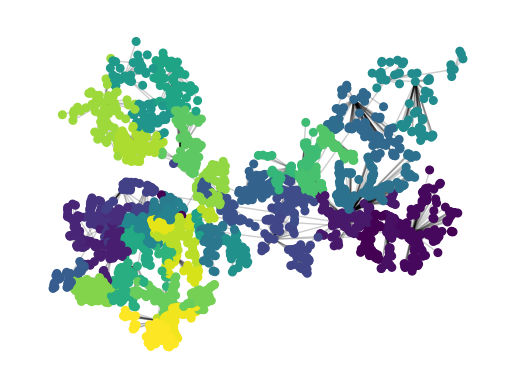

In [12]:
agglomeration.visualize_agglomerations(G)

In [31]:
graph_gdf = frame_method.save_graph_to_geojson(G)
graph_gdf

,geometry,name,level,population
0,POINT (33.75892 59.36227),Болото,Малое сельское поселение,111.0
1,POINT (33.78600 59.47518),Большой Остров,Малое сельское поселение,116.0
2,POINT (33.79236 59.47356),Бор,Малое сельское поселение,116.0
3,POINT (33.77572 59.44249),Бороватое,Малое сельское поселение,114.0
4,POINT (33.67728 59.32820),Бочево,Малое сельское поселение,108.0
...,...,...,...,...
5856,"LINESTRING (30.60534 59.49722, 30.58271 59.48439)",NaN,Малое сельское поселение,NaN
5857,"LINESTRING (30.52914 59.66430, 30.54176 59.63431)",NaN,Среднее сельское поселение,NaN
5858,"LINESTRING (30.52914 59.66430, 30.50370 59.63608)",NaN,Среднее сельское поселение,NaN
5859,"LINESTRING (30.52914 59.66430, 30.50283 59.68264)",NaN,Среднее сельское поселение,NaN


In [32]:
graph_gdf.to_file("graph_frame_gigadoroga.geojson", driver="GeoJSON")

In [127]:
graph_gdf.set_crs(epsg=4326, inplace=True)

graph_gdf = graph_gdf.to_crs(epsg=32636)
graph_gdf

,geometry,name,level,population
0,POINT (543142.339 6580637.744),Болото,Малое сельское поселение,111.0
1,POINT (544532.929 6593228.214),Большой Остров,Малое сельское поселение,116.0
2,POINT (544895.402 6593052.876),Бор,Малое сельское поселение,116.0
3,POINT (543993.111 6589582.121),Бороватое,Малое сельское поселение,114.0
4,POINT (538540.110 6576793.684),Бочево,Малое сельское поселение,108.0
...,...,...,...,...
5856,"LINESTRING (364428.938 6597861.468, 363096.424...",NaN,Малое сельское поселение,NaN
5857,"LINESTRING (360808.221 6616617.433, 361395.198...",NaN,Среднее сельское поселение,NaN
5858,"LINESTRING (360808.221 6616617.433, 359257.746...",NaN,Среднее сельское поселение,NaN
5859,"LINESTRING (360808.221 6616617.433, 359403.590...",NaN,Среднее сельское поселение,NaN


In [128]:
roads = gpd.read_file('/Users/mvin/Code/PopFrame/examples/citygraph_e_new_edges.geojson')
roads

,length_meter,type,time_sec,time_min,highway,maxspeed,reg,ref,is_exit,node_start,node_end,geometry
0,None,car,None,None,None,None,3,None,None,None,None,"LINESTRING (388531.583 6645027.824, 388878.670..."
1,None,car,None,None,None,None,2,None,None,None,None,"LINESTRING (389360.741 6643587.956, 390089.774..."
2,None,car,None,None,None,None,2,None,None,None,None,"LINESTRING (296939.192 6638387.996, 294578.209..."
3,None,car,None,None,None,None,1,None,None,None,None,"LINESTRING (410091.394 6569172.908, 415242.290..."
4,None,car,None,None,None,None,1,None,None,None,None,"LINESTRING (500319.706 6620043.274, 507678.347..."
5,None,car,None,None,None,None,2,None,None,None,None,"LINESTRING (561232.901 6726457.399, 567937.440..."
6,None,car,None,None,None,None,2,None,None,None,None,"LINESTRING (555345.988 6671839.930, 563195.205..."
7,None,car,None,None,None,None,1,None,None,None,None,"LINESTRING (409317.847 6568982.483, 406701.441..."


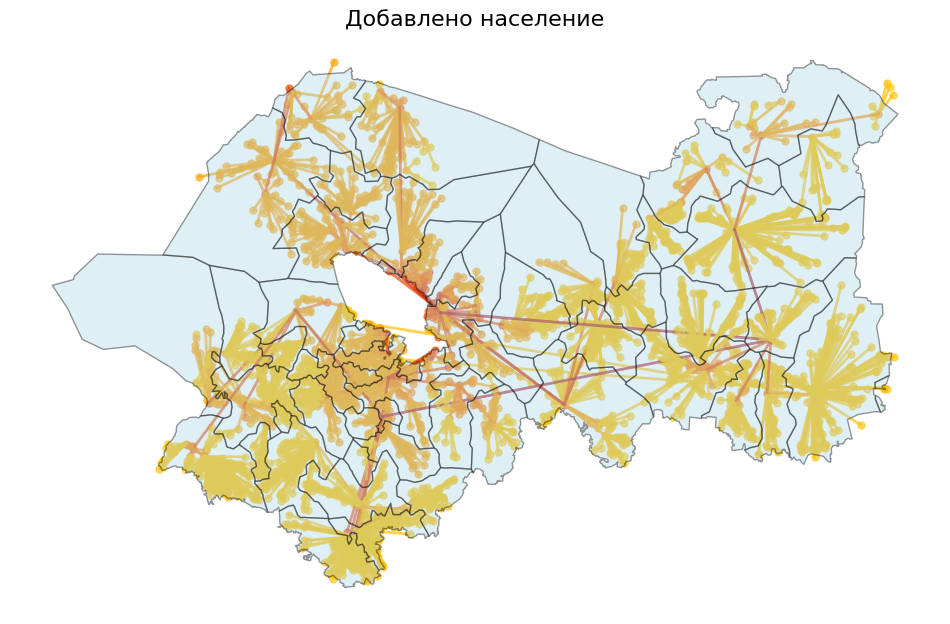

In [129]:
import matplotlib.colors as mcolors
import geopandas as gpd
import matplotlib.pyplot as plt

class GraphVisualizer:

    def get_color_map(self, levels):
        """Генерация цветовой карты для уровней населенных пунктов"""
        base_colors = ['#FFC100', '#FF6500', '#C40C0C', '#6C0345']  # Цвета от желтого до красного
        cmap = mcolors.LinearSegmentedColormap.from_list("heatmap", base_colors, N=len(levels))
        norm = mcolors.Normalize(vmin=0, vmax=len(levels) - 1)
        colors = [mcolors.to_hex(cmap(norm(i))) for i in range(len(levels))]
        return colors

    def visualize_graph(self, agglomerations_gdf, graph_gdf):
        """Визуализация агломераций и графа с цветами на основе уровней"""

        # Определение уровней
        levels = [
            "Малое сельское поселение",
            "Среднее сельское поселение",
            "Большое сельское поселение",
            "Крупное сельское поселение",
            "Малый город",
            "Средний город",
            "Большой город",
            "Крупный город",
            "Крупнейший город",
            "Сверхкрупный город"
        ]

        # Получаем цвета для уровней
        level_colors = dict(zip(levels, self.get_color_map(levels)))

        # Настраиваем фигуру для визуализации
        fig, ax = plt.subplots(figsize=(12, 12))

        # # Визуализируем агломерации с минимальной прозрачностью (чтобы видеть граф под ними)
        # agglomerations_gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.3, legend=True)

        # Визуализируем граф (линии и точки)
        for idx, row in graph_gdf.iterrows():
            geom = row.geometry
            level = row['level']
            color = level_colors.get(level, '#000000')  # Черный цвет по умолчанию, если уровень не найден

            if geom.geom_type == 'Point':
                # Визуализация точек (населенных пунктов)
                ax.plot(geom.x, geom.y, 'o', markersize=5, color=color, label=level, alpha=0.6)

            elif geom.geom_type == 'LineString':
                # Визуализация линий (дорог/связей)
                x, y = geom.xy
                ax.plot(x, y, color=color, linewidth=2, alpha=0.7)  # Прозрачность 40%

        # Повторная отрисовка агломераций с нормальной прозрачностью поверх графа
        agglomerations_gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.4, legend=False, zorder=99)
        # roads.plot(ax=ax, color='green', edgecolor='black', alpha=1, legend=False, zorder=100)
        # Удаление боковых границ с координатами
        ax.set_axis_off()

        # Добавляем заголовок
        plt.title('Добавлено население', fontsize=16)

        # Показываем график
        plt.show()


# Использование класса для визуализации
visualizer = GraphVisualizer()

# Визуализируем данные
visualizer.visualize_graph(agglomerations_gdf, graph_gdf)


In [130]:
from popframe.method.territory_evaluation import TerritoryEvaluation
from popframe.models.region import Region
from shapely.geometry import shape

evaluation = TerritoryEvaluation(region=region)

# Пример данных
# geojson_data = {
#   "type": "FeatureCollection",
#   "features": [
#     {
#       "type": "Feature",
#       "properties": {},
#       "geometry": {
#         "coordinates": [
#           [
#             [
#               29.982879431084967,
#               59.363554752593245
#             ],
#             [
#               29.982879431084967,
#               59.322083801173534
#             ],
#             [
#               30.109075699649765,
#               59.322083801173534
#             ],
#             [
#               30.109075699649765,
#               59.363554752593245
#             ],
#             [
#               29.982879431084967,
#               59.363554752593245
#             ]
#           ]
#         ],
#         "type": "Polygon"
#       }
#     }
#   ]
# }

geojson_data = {
    "geometry": {
        "type": "Polygon",
        "coordinates": [
            [
                [29.982879431084967, 59.363554752593245],
                [29.982879431084967, 59.322083801173534],
                [30.109075699649765, 59.322083801173534],
                [30.109075699649765, 59.363554752593245],
                [29.982879431084967, 59.363554752593245]
            ]
        ]
    },
    "properties": {},
    "type": "Feature"
}

# Преобразуем словарь в геометрию
geom = shape(geojson_data['geometry'])

# Создаем GeoDataFrame
territories_gdf = gpd.GeoDataFrame([{'geometry': geom}], crs='EPSG:4326')

result = evaluation.evaluate_territory_location(territories=territories_gdf)
result

[{'territory': 'None',
  'score': 8,
  'interpretation': 'территория находится внутри или непосредственной близости населенного пункта уровня Крупный город',
  'closest_settlement': 'Сиверский',
  'closest_settlement1': None,
  'closest_settlement2': None}]

## Каркас 2

In [1]:
from popframe.method.popuation_frame import PopFrame
from popframe.models.region import Region
region_model = Region.from_pickle('//Users/mvin/Code/PopFrame/examples/data/data_models/Ленинградская область2.pickle')
frame_method = PopFrame(region=region_model)

In [133]:
frame_method.build_circle_frame(output_type='html')  # or 'gdf'

'HTML map saved as final_circle.html'

In [33]:
output = frame_method.build_circle_frame(output_type='gdf')  # or 'gdf'
output

,id,name,population,level,geometry,settlement_name,district_name
0,0,Болото,111,Малое сельское поселение,"POLYGON ((3758260.573 8259102.313, 3758259.443...",Борское сельское поселение,Бокситогорский муниципальный район
1,1,Большой Остров,116,Малое сельское поселение,"POLYGON ((3761279.773 8283807.226, 3761278.618...",Борское сельское поселение,Бокситогорский муниципальный район
2,2,Бор,116,Малое сельское поселение,"POLYGON ((3761987.765 8283453.712, 3761986.610...",Борское сельское поселение,Бокситогорский муниципальный район
3,3,Бороватое,114,Малое сельское поселение,"POLYGON ((3760133.666 8276647.742, 3760132.521...",Борское сельское поселение,Бокситогорский муниципальный район
4,4,Бочево,108,Малое сельское поселение,"POLYGON ((3749169.369 8251663.313, 3749168.255...",Борское сельское поселение,Бокситогорский муниципальный район
...,...,...,...,...,...,...,...
2926,2926,Апраксин Бор,96,Малое сельское поселение,"POLYGON ((3477193.972 8217267.914, 3477192.922...",Трубникоборское сельское поселение,Тоснненский муниципальный район
2927,2927,Александровка,98,Малое сельское поселение,"POLYGON ((3486662.280 8220919.584, 3486661.219...",Трубникоборское сельское поселение,Тоснненский муниципальный район
2928,2928,Большая Горка,100,Малое сельское поселение,"POLYGON ((3503961.305 8244222.283, 3503960.233...",Трубникоборское сельское поселение,Тоснненский муниципальный район
2929,2929,Дроздово,101,Малое сельское поселение,"POLYGON ((3502629.676 8246185.212, 3502628.599...",Трубникоборское сельское поселение,Тоснненский муниципальный район


In [34]:
output.to_file("circle_frame_gigadoroga.geojson", driver="GeoJSON")

In [35]:
output.explore()